# Data Preperation

In [ ]:
import urllib.request,sys,time
from bs4 import BeautifulSoup
import requests
import pandas as pd

In [ ]:
from google.colab import data_table
data_table.enable_dataframe_formatter()


### Web Scraping India Today News with BeautifulSoup and Requests

#### Objective:
To extract news articles from India Today across different categories using web scraping techniques.

#### Tools Used:
- **Libraries:** BeautifulSoup, requests, pandas
- **Environment:** Google Colab (for scripting)

#### Steps:

1. **Imports and Setup:**
   - Import necessary libraries (`urllib.request`, `sys`, `time`, `BeautifulSoup`, `requests`, `pandas`).
   - Set up initial configurations.

2. **URLs and Categories:**
   - Define a list of original URLs representing different categories from India Today.

3. **Scraping Process:**
   - Iterate through each URL in the list.
   - Fetch webpage content using `requests.get(url)`.
   - Parse HTML content using BeautifulSoup (`soup = BeautifulSoup(page.text, 'html.parser')`).

4. **Data Extraction:**
   - Find all relevant div elements (`catagory-listing`).
   - Extract `Statement`, `Link`, `Date`, and `Para` (paragraph content) for each article.

5. **Data Processing:**
   - Construct the `Link` based on conditions for each category.
   - Extract `Date` from the end of the `Link`.

6. **Output:**
   - Accumulate extracted data (`ID, Statement, Link, Para, Category, Date`) into a list.
   - Write data to a CSV file (`NEWS.csv`) using pandas.

In [ ]:
final_list=[]
original = ['https://www.indiatoday.in/india', 'https://www.indiatoday.in/business', 'https://www.indiatoday.in/world', 'https://www.indiatoday.in/cities',
            'https://www.indiatoday.in/science', 'https://www.indiatoday.in/binge-watch', 'https://www.indiatoday.in/health', 'https://www.indiatoday.in/technology/tech-tips',
            'https://www.indiatoday.in/education-today/news']
for u in original:
  url = u
  print(url)
  kind = url.split('/')[-1];
  length = len(kind)
  try:
        page=requests.get(url)

  except Exception as e:
      error_type, error_obj, error_info = sys.exc_info()      # get the exception information
      print ('ERROR FOR LINK:',url)                          #print the link that cause the problem
      print (error_type, 'Line:', error_info.tb_lineno)
      continue
  soup=BeautifulSoup(page.text,'html.parser')
  frame=[]
  links=soup.find_all('div',attrs={'class':'catagory-listing'})
  filename="NEWS.csv"
  f=open(filename,"w", encoding = 'utf-8')
  headers="ID,Statement,Link,Para,Category,Date\n"
  f.write(headers)
  for j in links:
      Statement = j.find("div",attrs={'class':'detail'}).find('h2')['title'].strip()
      Link = url
      s2 = 'https://www.indiatoday.in/'
      s1 = Link[0:len(Link)-length]
      string = j.find("div",attrs={'class':'detail'}).find('a')['href'].strip()
      s = string[0:length+1]
      if(kind == 'science' and s == '/environ'):
        Link = s1 + string[1:]
      elif(kind == 'binge-watch' and s[:7] != 'binge-w'):
        Link = s2 + string[1:]
      elif((kind == 'india' or kind == 'cities') and s == '/crime'):
        Link = s1 + string[1:]
      elif(kind == 'cities' or s == '/crime'):
        Link = s2 + string[1:]
      elif(kind == 'india' or s == '/cities'):
        Link = s2 + string[1:]
      elif(kind == 'world' or s == '/prog'):
        Link = s2 + string[1:]
      elif(kind == 'business' and s == '/magazine'):
        Link = s1 + string[1:]
      elif(kind == 'tech-tips' and s == '/technolog'):
        Link = s2 + string[1:]
      elif(kind == 'news' and s == '/educ'):
        Link = s2 + string[1:]
      elif(s[1:] == kind):
        Link += string[length+1:]
      else:
        Link += string
      if(kind == 'tech-tips'):
        kind = 'technology'
      print(Link)
      Date = Link[len(Link)-10:len(Link)]
      Para = j.find("div",attrs={'class':'detail'}).text.strip()
      Category = kind
      ID = Link.split("-")[-4]
      if(Date >= '2022-03-01'):
        frame.append((ID,Statement,Link,Para,Category,Date))
        f.write(ID+Statement.replace(",","^")+","+Link+","+Para.replace(",","^")+Category+Date+"\n")
  final_list.extend(frame)

https://www.indiatoday.in/india
https://www.indiatoday.in/india/story/met-at-ipl-match-marriage-deepak-chahar-jaya-bharadwaj-1957737-2022-06-03
https://www.indiatoday.in/india/story/defence-minister-rajnath-singh-israeli-counterpart-benjamin-gantz-bilateral-talks-1957733-2022-06-03
https://www.indiatoday.in/india/story/cases-twice-suspended-dismissed-cop-sachin-waze-details-1957731-2022-06-03
https://www.indiatoday.in/india/story/amit-shah-bjp-support-telangana-formation-1957724-2022-06-02
https://www.indiatoday.in/india/story/amit-shah-nsa-ajit-doval-raw-chief-targeted-killings-kashmir-1957722-2022-06-02
https://www.indiatoday.in/india/story/shivling-in-mosque-rss-chief-mohan-bhagwat-1957718-2022-06-02
https://www.indiatoday.in/india/story/archaeological-survey-taj-mahal-lord-krishna-image-uttar-pradesh-seer-1957711-2022-06-02
https://www.indiatoday.in/india/story/congress-needs-to-win-rajasthan-chhattisgarh-again-before-facing-2024-lok-sabha-polls-says-ashok-gehlot-1957713-2022-06-02

In [ ]:
print(final_list)

[('1957737', 'Met at IPL match, within a year decided to marry her, says Deepak Chahar after marrying Jaya Bharadwaj', 'https://www.indiatoday.in/india/story/met-at-ipl-match-marriage-deepak-chahar-jaya-bharadwaj-1957737-2022-06-03', 'Met at IPL match, within a year decided to marry her, says Deepak Chahar after marrying Jaya BharadwajWe met at an IPL match last year, became friends and decided to get married,\nsaid Deepak Chahar on marrying Jaya Bharadwaj.', 'india', '2022-06-03'), ('1957733', 'Defence Minister Rajnath Singh, Israeli counterpart Benjamin Gantz hold bilateral talks', 'https://www.indiatoday.in/india/story/defence-minister-rajnath-singh-israeli-counterpart-benjamin-gantz-bilateral-talks-1957733-2022-06-03', 'Defence Minister Rajnath Singh, Israeli counterpart Benjamin Gantz hold bilateral talksDefence Minister Rajnath Singh and his Israeli counterpart Benjamin Gantz\nheld bilateral talks in New Delhi on Thursday.', 'india', '2022-06-03'), ('1957731', 'What are the cases

In [ ]:
pagesToGet= 15
urls = ['https://www.indiatoday.in/india?page=', 'https://www.indiatoday.in/business?page=', 'https://www.indiatoday.in/world?page=', 'https://www.indiatoday.in/science?page=',
        'https://www.indiatoday.in/cities?page=', 'https://www.indiatoday.in/binge-watch?page=', 'https://www.indiatoday.in/health?page=', 'https://www.indiatoday.in/technology/tech-tips?page=',
        'https://www.indiatoday.in/education-today/news?page=']
for u in urls:
  s1 = 'https://www.indiatoday.in'
  for page in range(1,pagesToGet+1):
    s = page
    print('processing page :', page)
    url = f'{u}{page}'
    print(url)
    k = url.split('/')[-1]
    kind = k.split('?')[0]
    try:
        page=requests.get(url)

    except Exception as e:
        error_type, error_obj, error_info = sys.exc_info()      # get the exception information
        print ('ERROR FOR LINK:',url)                          #print the link that cause the problem
        print (error_type, 'Line:', error_info.tb_lineno)
        continue
    soup=BeautifulSoup(page.text,'html.parser')
    frame=[]
    links=soup.find_all('div',attrs={'class':'catagory-listing'})
    filename="NEWS.csv"
    f=open(filename,"a", encoding = 'utf-8')

    for j in links:
      try:
        Statement = j.find("div",attrs={'class':'detail'}).find('h2')['title'].strip()
        Link = s1
        Link += j.find("div",attrs={'class':'detail'}).find('a')['href'].strip()
        print(Link)
        Para = j.find("div",attrs={'class':'detail'}).text.strip()
        Category = kind
        Date = Link[len(Link)-10:len(Link)]
        ID = Link.split("-")[-4]
        if(Date >= '2022-03-01'):
          frame.append((ID,Statement,Link,Para,Category,Date))
          f.write(ID+Statement.replace(",","^")+","+Link+","+Para.replace(",","^")+Category+Date+"\n")
      except:
        continue
    final_list.extend(frame)
f.close()

processing page : 1
https://www.indiatoday.in/india?page=1
https://www.indiatoday.in/india/video/targeted-killings-in-j-k-is-the-govt-unable-to-provide-security-1957698-2022-06-02
https://www.indiatoday.in/india/story/rahul-gandhi-congress-leader-prithviraj-chavan-chintan-shivir-1957696-2022-06-02
https://www.indiatoday.in/india/story/punjab-news-child-killed-for-injured-bike-car-collision-sangrur-1957671-2022-06-02
https://www.indiatoday.in/india/maharashtra/story/maharashtra-chief-minister-asks-people-to-maintain-discipline-avoid-covid-restrictions-1957669-2022-06-02
https://www.indiatoday.in/india/story/migrant-labourers-terror-attack-jammu-kashmir-budgam-1957668-2022-06-02
https://www.indiatoday.in/india/story/sachin-pilot-slams-centre-targeting-congress-leaders-1957667-2022-06-02
https://www.indiatoday.in/india/story/popular-front-ed-action-bank-accounts-money-laundering-case-1957662-2022-06-02
https://www.indiatoday.in/india/bihar/story/bihar-cabinet-nitish-kumar-caste-based-cens

### Scraping Multiple Pages from India Today

In [ ]:
original = ['https://www.indiatoday.in/sports/cricket', 'https://www.indiatoday.in/sports/football', 'https://www.indiatoday.in/sports/tennis',
            'https://www.indiatoday.in/sports/other-sports']
for u in original:
  url = u
  print(url)
  kind = url.split('/')[-1];
  length = len(kind)
  try:
        page=requests.get(url)

  except Exception as e:
      error_type, error_obj, error_info = sys.exc_info()      # get the exception information
      print ('ERROR FOR LINK:',url)                          #print the link that cause the problem
      print (error_type, 'Line:', error_info.tb_lineno)
      continue
  soup=BeautifulSoup(page.text,'html.parser')
  frame=[]
  links=soup.find_all('div',attrs={'class':'catagory-listing'})
  filename="NEWS.csv"
  f=open(filename,"w", encoding = 'utf-8')
  headers="ID,Statement,Link,Para,Category,Date\n"
  f.write(headers)
  for j in links:
      Statement = j.find("div",attrs={'class':'detail'}).find('h2')['title'].strip()
      Link = url
      s2 = 'https://www.indiatoday.in/'
      s1 = Link[0:len(Link)-length]
      string = j.find("div",attrs={'class':'detail'}).find('a')['href'].strip()
      s = string[0:length+1]
      Link = s2 + string[1:]
      print(Link)
      Date = Link[len(Link)-10:len(Link)]
      Para = j.find("div",attrs={'class':'detail'}).text.strip()
      Category = "sports"
      ID = Link.split("-")[-4]
      if(Date >= '2022-03-01'):
        frame.append((ID,Statement,Link,Para,Category,Date))
        f.write(ID+Statement.replace(",","^")+","+Link+","+Para.replace(",","^")+Category+Date+"\n")
  final_list.extend(frame)

https://www.indiatoday.in/sports/cricket
https://www.indiatoday.in/sports/cricket/story/rehab-going-well-ajinkya-rahane-hoping-to-get-back-on-track-as-soon-as-possible-for-india-comeback-1957720-2022-06-02
https://www.indiatoday.in/sports/cricket/story/lord-s-test-england-collapse-after-james-anderson-matthew-potts-heroics-on-17-wicket-day-1-1957716-2022-06-02
https://www.indiatoday.in/sports/cricket/story/sri-lanka-cricket-appoints-lasith-malinga-as-bowling-strategy-coach-for-white-ball-series-against-australia-1957663-2022-06-02
https://www.indiatoday.in/sports/cricket/story/eng-vs-nz-lord-s-comes-together-in-the-23rd-over-to-pay-tribute-to-late-shane-warne-1957621-2022-06-02
https://www.indiatoday.in/sports/cricket/story/shakib-al-hasan-returns-as-bangladesh-test-captain-replaces-mominul-haque-1957609-2022-06-02
https://www.indiatoday.in/sports/cricket/story/eng-vs-nz-called-up-after-leach-concussion-matt-parkinson-travels-320-kilometres-to-make-debut-for-england-1957604-2022-06-02


In [ ]:
pagesToGet= 4
urls = ['https://www.indiatoday.in/sports/cricket?page=', 'https://www.indiatoday.in/sports/football?page=', 'https://www.indiatoday.in/sports/tennis?page=',
        'https://www.indiatoday.in/sports/other-sports?page=']
for u in urls:
  s1 = 'https://www.indiatoday.in'
  for page in range(1,pagesToGet+1):
    s = page
    print('processing page :', page)
    url = f'{u}{page}'
    print(url)
    k = url.split('/')[-1]
    kind = k.split('?')[0]
    try:
        page=requests.get(url)

    except Exception as e:
        error_type, error_obj, error_info = sys.exc_info()      # get the exception information
        print ('ERROR FOR LINK:',url)                          #print the link that cause the problem
        print (error_type, 'Line:', error_info.tb_lineno)
        continue
    soup=BeautifulSoup(page.text,'html.parser')
    frame=[]
    links=soup.find_all('div',attrs={'class':'catagory-listing'})
    filename="NEWS.csv"
    f=open(filename,"a", encoding = 'utf-8')

    for j in links:
      try:
        Statement = j.find("div",attrs={'class':'detail'}).find('h2')['title'].strip()
        Link = s1
        Link += j.find("div",attrs={'class':'detail'}).find('a')['href'].strip()
        print(Link)
        Para = j.find("div",attrs={'class':'detail'}).text.strip()
        Category = "sports"
        Date = Link[len(Link)-10:len(Link)]
        ID = Link.split("-")[-4]
        if(Date >= '2022-03-01'):
          frame.append((ID,Statement,Link,Para,Category,Date))
          f.write(ID+Statement.replace(",","^")+","+Link+","+Para.replace(",","^")+Category+Date+"\n")
      except:
        continue
    final_list.extend(frame)
f.close()

processing page : 1
https://www.indiatoday.in/sports/cricket?page=1
https://www.indiatoday.in/sports/cricket/story/eng-vs-nz-time-to-get-stuck-in-home-of-cricket-ajaz-patel-excited-to-play-against-england-at-lord-s-1957421-2022-06-02
https://www.indiatoday.in/sports/cricket/story/moeen-ali-named-in-queen-s-honours-list-awarded-order-of-the-british-empire-for-services-to-cricket-1957377-2022-06-02
https://www.indiatoday.in/sports/cricket/story/eng-vs-nz-brendon-mccullum-is-mates-with-a-number-of-guys-but-we-will-focus-on-cricket-kane-williamson-1957344-2022-06-02
https://www.indiatoday.in/sports/cricket/story/brendon-mccullum-makes-us-feel-10-feet-tall-england-test-captain-ben-stokes-hails-new-coach-1957337-2022-06-02
https://www.indiatoday.in/sports/cricket/story/door-is-open-for-moeen-ali-s-test-return-as-england-begin-new-era-under-coach-brendon-mccullum-1957323-2022-06-02
https://www.indiatoday.in/sports/cricket/story/australia-arrive-in-sri-lanka-for-six-week-all-format-cricket-tou

### Scraped News Data Summary

#### DataFrame Overview:
- **Dimensions:** 1712 rows × 7 columns
- **Columns:** `Article_ID`, `Statement`, `Link`, `Para`, `Category`, `Date`, `row_num`
  - `Article_ID`: Unique identifier for each article.
  - `Statement`: Headline or main statement from the article.
  - `Link`: URL link to the full article.
  - `Para`: Paragraph text summarizing the article content.
  - `Category`: Category of the article (normalized to `technology` from `tech-tips`).
  - `Date`: Date of publication.
  - `row_num`: Sequential index for each row.

#### Operations:
1. **Data Normalization:**
   - Replaced `tech-tips` category with `technology`.

2. **Row Indexing:**
   - Added a new column `row_num` as a sequential index for rows.

#### Conclusion:
This DataFrame (`data`) contains comprehensive data scraped from various categories of articles on the India Today website. It is structured for further analysis, exploration, or visualization tasks.

In [ ]:
data=pd.DataFrame(final_list, columns=['Article_ID','Statement','Link','Para','Category','Date'])

In [ ]:
data['Category'] = data['Category'].replace(['tech-tips'],'technology')

In [ ]:
import numpy as np
data['row_num'] = np.arange(len(data))

In [ ]:
data

,Article_ID,Statement,Link,Para,Category,Date,row_num
0,1957737,"Met at IPL match, within a year decided to mar...",https://www.indiatoday.in/india/story/met-at-i...,"Met at IPL match, within a year decided to mar...",india,2022-06-03,0
1,1957733,"Defence Minister Rajnath Singh, Israeli counte...",https://www.indiatoday.in/india/story/defence-...,"Defence Minister Rajnath Singh, Israeli counte...",india,2022-06-03,1
2,1957731,What are the cases against twice suspended and...,https://www.indiatoday.in/india/story/cases-tw...,What are the cases against twice suspended and...,india,2022-06-03,2
3,1957724,BJP always supported formation of Telangana: A...,https://www.indiatoday.in/india/story/amit-sha...,BJP always supported formation of Telangana: A...,india,2022-06-02,3
4,1957722,"Amit Shah meets NSA Ajit Doval, RAW chief to d...",https://www.indiatoday.in/india/story/amit-sha...,"Amit Shah meets NSA Ajit Doval, RAW chief to d...",india,2022-06-02,4
...,...,...,...,...,...,...,...
1707,1946675,Asian Games postponement: National federations...,https://www.indiatoday.in/sports/other-sports/...,Asian Games postponement: NSFs set to field be...,sports,2022-05-07,1707
1708,1946659,Santiago Nieva steps down as High Performance ...,https://www.indiatoday.in/sports/other-sports/...,Santiago Nieva steps down as High Performance ...,sports,2022-05-07,1708
1709,1946642,World No. 3 Para shuttler Sukant Kadam ignored...,https://www.indiatoday.in/sports/other-sports/...,"Ignored from TOPS core list, World No. 3 Kadam...",sports,2022-05-07,1709
1710,1946539,Avinash Sable breaks Bahadur Prasad's 30-year-...,https://www.indiatoday.in/sports/other-sports/...,Avinash Sable smashes 30-year-old 5000m nation...,sports,2022-05-07,1710


### Installed Newspaper3k for future use in scraping articles and extracting article text from URLs stored in a DataFrame using the Newspaper library.



In [ ]:
!pip install newspaper3k

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 211 kB 4.4 MB/s 
     |████████████████████████████████| 81 kB 8.2 MB/s 
     |████████████████████████████████| 7.4 MB 20.0 MB/s 
     |████████████████████████████████| 93 kB 1.8 MB/s 
  Created wheel for tinysegmenter: filename=tinysegmenter-0.3-py3-none-any.whl size=13553 sha256=e600f29501eb04a0b9013882c865f67d3c27cf133d067218ba890c48dfbe9b95
  Stored in directory: /root/.cache/pip/wheels/df/67/41/faca10fa501ca010be41b49d40360c2959e1c4f09bcbfa37fa
  Created wheel for feedfinder2: filename=feedfinder2-0.0.4-py3-none-any.whl size=3357 sha256=45c811d479ee305219079b77d9b18b7f6fddf93141aa710b19dbd18b018d8245
  Stored in directory: /root/.cache/pip/wheels/7f/d4/8f/6e2ca54744c9d7292d88ddb8d42876bcdab5e6d84a21c10346
  Created wheel for jieba3k: filename=jieba3k-0.35.1-py3-none-any.whl size=7398404 sha256=e24e6d2441a5e1ef51b589ceac3fe04ead136df12bb323e53

In [ ]:
data['Articles'] = data['Link']

In [ ]:
data

,Article_ID,Statement,Link,Para,Category,Date,row_num,Articles
0,1957737,"Met at IPL match, within a year decided to mar...",https://www.indiatoday.in/india/story/met-at-i...,"Met at IPL match, within a year decided to mar...",india,2022-06-03,0,https://www.indiatoday.in/india/story/met-at-i...
1,1957733,"Defence Minister Rajnath Singh, Israeli counte...",https://www.indiatoday.in/india/story/defence-...,"Defence Minister Rajnath Singh, Israeli counte...",india,2022-06-03,1,https://www.indiatoday.in/india/story/defence-...
2,1957731,What are the cases against twice suspended and...,https://www.indiatoday.in/india/story/cases-tw...,What are the cases against twice suspended and...,india,2022-06-03,2,https://www.indiatoday.in/india/story/cases-tw...
3,1957724,BJP always supported formation of Telangana: A...,https://www.indiatoday.in/india/story/amit-sha...,BJP always supported formation of Telangana: A...,india,2022-06-02,3,https://www.indiatoday.in/india/story/amit-sha...
4,1957722,"Amit Shah meets NSA Ajit Doval, RAW chief to d...",https://www.indiatoday.in/india/story/amit-sha...,"Amit Shah meets NSA Ajit Doval, RAW chief to d...",india,2022-06-02,4,https://www.indiatoday.in/india/story/amit-sha...
...,...,...,...,...,...,...,...,...
1707,1946675,Asian Games postponement: National federations...,https://www.indiatoday.in/sports/other-sports/...,Asian Games postponement: NSFs set to field be...,sports,2022-05-07,1707,https://www.indiatoday.in/sports/other-sports/...
1708,1946659,Santiago Nieva steps down as High Performance ...,https://www.indiatoday.in/sports/other-sports/...,Santiago Nieva steps down as High Performance ...,sports,2022-05-07,1708,https://www.indiatoday.in/sports/other-sports/...
1709,1946642,World No. 3 Para shuttler Sukant Kadam ignored...,https://www.indiatoday.in/sports/other-sports/...,"Ignored from TOPS core list, World No. 3 Kadam...",sports,2022-05-07,1709,https://www.indiatoday.in/sports/other-sports/...
1710,1946539,Avinash Sable breaks Bahadur Prasad's 30-year-...,https://www.indiatoday.in/sports/other-sports/...,Avinash Sable smashes 30-year-old 5000m nation...,sports,2022-05-07,1710,https://www.indiatoday.in/sports/other-sports/...


In [ ]:
from newspaper import Article

In [ ]:
def getarticle(url):
  try:
    article = Article(url)
    article.download()
    article.parse()
  except Exception as e:
    return
  return article.text

In [ ]:
data.Articles = data.Articles.apply(getarticle)

In [ ]:
data.head()

,Article_ID,Statement,Link,Para,Category,Date,row_num,Articles
0,1957737,"Met at IPL match, within a year decided to mar...",https://www.indiatoday.in/india/story/met-at-i...,"Met at IPL match, within a year decided to mar...",india,2022-06-03,0,India pacer Deepak Chahar tied the knot with h...
1,1957733,"Defence Minister Rajnath Singh, Israeli counte...",https://www.indiatoday.in/india/story/defence-...,"Defence Minister Rajnath Singh, Israeli counte...",india,2022-06-03,1,Defence Minister Rajnath Singh met with Defenc...
2,1957731,What are the cases against twice suspended and...,https://www.indiatoday.in/india/story/cases-tw...,What are the cases against twice suspended and...,india,2022-06-03,2,"Former Mumbai Police officer Sachin Waze, who ..."
3,1957724,BJP always supported formation of Telangana: A...,https://www.indiatoday.in/india/story/amit-sha...,BJP always supported formation of Telangana: A...,india,2022-06-02,3,Union Home Minister Amit Shah on Thursday asse...
4,1957722,"Amit Shah meets NSA Ajit Doval, RAW chief to d...",https://www.indiatoday.in/india/story/amit-sha...,"Amit Shah meets NSA Ajit Doval, RAW chief to d...",india,2022-06-02,4,Hours after a Hindu bank employee was killed i...


In [ ]:
import gensim
from gensim.summarization import summarize
from gensim.summarization import keywords

In [ ]:
import numpy as np
def summary_answer(text):
    try:
        return summarize(text)
    except ValueError:
        return text
data['Articles'] = data['Articles'].replace(np.nan, '')
data['Summary'] = data['Articles'].apply(summary_answer)

In [ ]:
data.head()

,Article_ID,Statement,Link,Para,Category,Date,row_num,Articles,Summary
0,1957737,"Met at IPL match, within a year decided to mar...",https://www.indiatoday.in/india/story/met-at-i...,"Met at IPL match, within a year decided to mar...",india,2022-06-03,0,India pacer Deepak Chahar tied the knot with h...,India pacer Deepak Chahar tied the knot with h...
1,1957733,"Defence Minister Rajnath Singh, Israeli counte...",https://www.indiatoday.in/india/story/defence-...,"Defence Minister Rajnath Singh, Israeli counte...",india,2022-06-03,1,Defence Minister Rajnath Singh met with Defenc...,Defence Minister Rajnath Singh met with Defenc...
2,1957731,What are the cases against twice suspended and...,https://www.indiatoday.in/india/story/cases-tw...,What are the cases against twice suspended and...,india,2022-06-03,2,"Former Mumbai Police officer Sachin Waze, who ...","Former Mumbai Police officer Sachin Waze, who ..."
3,1957724,BJP always supported formation of Telangana: A...,https://www.indiatoday.in/india/story/amit-sha...,BJP always supported formation of Telangana: A...,india,2022-06-02,3,Union Home Minister Amit Shah on Thursday asse...,Union Home Minister Amit Shah on Thursday asse...
4,1957722,"Amit Shah meets NSA Ajit Doval, RAW chief to d...",https://www.indiatoday.in/india/story/amit-sha...,"Amit Shah meets NSA Ajit Doval, RAW chief to d...",india,2022-06-02,4,Hours after a Hindu bank employee was killed i...,Hours after a Hindu bank employee was killed i...


# Analysing the Data

Data Preprocessing: It replaces the category name 'news' with 'education' in the DataFrame.

Data Analysis: It computes the frequency of each category in the dataset and stores the results in a dictionary called value_dict.

In [ ]:
from wordcloud import WordCloud

In [ ]:
data['Category'] = data['Category'].replace(['news'],'education')

In [ ]:
values = data['Category'].value_counts(dropna=False).keys().tolist()
counts = data['Category'].value_counts(dropna=False).tolist()
value_dict = dict(zip(values, counts))

In [ ]:
value_dict

{'binge-watch': 192,
 'business': 192,
 'cities': 192,
 'education': 192,
 'health': 68,
 'india': 192,
 'science': 192,
 'sports': 240,
 'technology': 60,
 'world': 192}

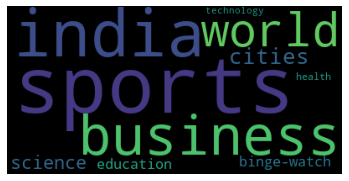

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
wordcloud = WordCloud().generate_from_frequencies(value_dict)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [ ]:
data['Date'].value_counts()

2022-06-02    284
2022-06-01    215
2022-05-31    124
2022-05-30    106
2022-05-27     83
             ... 
ia-war-it/      1
nic-photos      1
2022-04-30      1
2022-04-03      1
2022-03-15      1
Name: Date, Length: 75, dtype: int64

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
a = data['Date'].value_counts()
plt.rcParams.update({'font.size': 150})
plt.figure(figsize=(400,100))
x = sns.countplot(x='Date',data=data)
x.set_xticklabels(x.get_xticklabels(), rotation=40, ha="right")
plt.rcParams["axes.labelsize"] = 150
plt.show()

In [ ]:
import numpy as np
data['row_num'] = np.arange(len(data))

In [ ]:
users_list = list(range(1, 51))

In [ ]:
data["User_ID"] = np.random.choice(users_list, size=len(data))

In [ ]:
data

,Article_ID,Statement,Link,Para,Category,Date,row_num,Articles,Summary,User_ID
0,1957737,"Met at IPL match, within a year decided to mar...",https://www.indiatoday.in/india/story/met-at-i...,"Met at IPL match, within a year decided to mar...",india,2022-06-03,0,India pacer Deepak Chahar tied the knot with h...,India pacer Deepak Chahar tied the knot with h...,11
1,1957733,"Defence Minister Rajnath Singh, Israeli counte...",https://www.indiatoday.in/india/story/defence-...,"Defence Minister Rajnath Singh, Israeli counte...",india,2022-06-03,1,Defence Minister Rajnath Singh met with Defenc...,Defence Minister Rajnath Singh met with Defenc...,13
2,1957731,What are the cases against twice suspended and...,https://www.indiatoday.in/india/story/cases-tw...,What are the cases against twice suspended and...,india,2022-06-03,2,"Former Mumbai Police officer Sachin Waze, who ...","Former Mumbai Police officer Sachin Waze, who ...",5
3,1957724,BJP always supported formation of Telangana: A...,https://www.indiatoday.in/india/story/amit-sha...,BJP always supported formation of Telangana: A...,india,2022-06-02,3,Union Home Minister Amit Shah on Thursday asse...,Union Home Minister Amit Shah on Thursday asse...,21
4,1957722,"Amit Shah meets NSA Ajit Doval, RAW chief to d...",https://www.indiatoday.in/india/story/amit-sha...,"Amit Shah meets NSA Ajit Doval, RAW chief to d...",india,2022-06-02,4,Hours after a Hindu bank employee was killed i...,Hours after a Hindu bank employee was killed i...,3
...,...,...,...,...,...,...,...,...,...,...
1707,1946675,Asian Games postponement: National federations...,https://www.indiatoday.in/sports/other-sports/...,Asian Games postponement: NSFs set to field be...,sports,2022-05-07,1707,The postponement of the Asian Games until 2023...,NSFs such as the Wrestling Federation of India...,6
1708,1946659,Santiago Nieva steps down as High Performance ...,https://www.indiatoday.in/sports/other-sports/...,Santiago Nieva steps down as High Performance ...,sports,2022-05-07,1708,Santiago Nieva has resigned as the Indian boxi...,"Nieva, who took charge of the national team in...",50
1709,1946642,World No. 3 Para shuttler Sukant Kadam ignored...,https://www.indiatoday.in/sports/other-sports/...,"Ignored from TOPS core list, World No. 3 Kadam...",sports,2022-05-07,1709,"Ignored from TOPS core list, World No. 3 Kadam...",Para shuttler Sukant Kadam on Saturday express...,31
1710,1946539,Avinash Sable breaks Bahadur Prasad's 30-year-...,https://www.indiatoday.in/sports/other-sports/...,Avinash Sable smashes 30-year-old 5000m nation...,sports,2022-05-07,1710,India’s Avinash Sable smashed a 30-year-old re...,India’s Avinash Sable smashed a 30-year-old re...,13


In [ ]:
data['User_ID'].value_counts()

24    51
40    45
9     44
3     44
13    43
15    43
21    40
31    40
7     40
11    39
37    39
49    39
5     39
23    38
41    38
6     37
43    37
4     36
35    36
17    35
8     35
10    35
1     35
46    35
42    35
36    34
34    34
25    33
19    33
26    33
29    33
50    31
33    31
47    30
32    30
38    30
18    29
27    29
14    29
39    28
12    28
22    28
30    28
16    27
20    27
2     27
44    27
45    26
28    26
48    23
Name: User_ID, dtype: int64

1. **Word Cloud Visualization**:
   - It generates a word cloud from the `value_dict` dictionary using `WordCloud()` and displays it using Matplotlib.
   - This visualization helps in understanding the frequency distribution of categories in the dataset visually.

2. **Date Count Visualization**:
   - It counts the occurrences of each date in the 'Date' column (`data['Date'].value_counts()`).
   - Uses Seaborn and Matplotlib to create a count plot (`sns.countplot`) of dates, with dates on the x-axis and their respective counts on the y-axis.
   - Adjusts font sizes and plot size (`plt.rcParams.update`, `plt.figure(figsize=...)`) for better readability and presentation.

3. **Adding User IDs**:
   - It adds a new column 'User_ID' to the DataFrame (`data`) with randomly generated IDs (`np.random.choice`).
   - `users_list` is a range from 1 to 50, and each row in the DataFrame gets assigned a random User ID from this list.


In [ ]:
data.to_csv('articles.csv')

In [ ]:
news_articles = pd.read_csv("/content/articles.csv")
news_articles.head()

,Unnamed: 0,Article_ID,Statement,Link,Para,Category,Date,row_num,Articles,Summary,User_ID
0,0,1957737,"Met at IPL match, within a year decided to mar...",https://www.indiatoday.in/india/story/met-at-i...,"Met at IPL match, within a year decided to mar...",india,2022-06-03,0,India pacer Deepak Chahar tied the knot with h...,India pacer Deepak Chahar tied the knot with h...,11
1,1,1957733,"Defence Minister Rajnath Singh, Israeli counte...",https://www.indiatoday.in/india/story/defence-...,"Defence Minister Rajnath Singh, Israeli counte...",india,2022-06-03,1,Defence Minister Rajnath Singh met with Defenc...,Defence Minister Rajnath Singh met with Defenc...,13
2,2,1957731,What are the cases against twice suspended and...,https://www.indiatoday.in/india/story/cases-tw...,What are the cases against twice suspended and...,india,2022-06-03,2,"Former Mumbai Police officer Sachin Waze, who ...","Former Mumbai Police officer Sachin Waze, who ...",5
3,3,1957724,BJP always supported formation of Telangana: A...,https://www.indiatoday.in/india/story/amit-sha...,BJP always supported formation of Telangana: A...,india,2022-06-02,3,Union Home Minister Amit Shah on Thursday asse...,Union Home Minister Amit Shah on Thursday asse...,21
4,4,1957722,"Amit Shah meets NSA Ajit Doval, RAW chief to d...",https://www.indiatoday.in/india/story/amit-sha...,"Amit Shah meets NSA Ajit Doval, RAW chief to d...",india,2022-06-02,4,Hours after a Hindu bank employee was killed i...,Hours after a Hindu bank employee was killed i...,3


In [ ]:
d_f = data.groupby('User_ID')

In [ ]:
news = []

In [ ]:
for i in range(1,51):
  news.append(d_f.get_group(i)["row_num"].tolist())

In [ ]:
news

[[9,
  16,
  41,
  89,
  96,
  173,
  219,
  225,
  230,
  425,
  463,
  528,
  547,
  553,
  589,
  612,
  708,
  887,
  924,
  926,
  928,
  1016,
  1028,
  1070,
  1115,
  1318,
  1458,
  1460,
  1475,
  1483,
  1529,
  1602,
  1610,
  1617,
  1624],
 [20,
  43,
  87,
  188,
  189,
  357,
  494,
  525,
  551,
  668,
  788,
  801,
  818,
  907,
  908,
  912,
  1025,
  1057,
  1200,
  1218,
  1223,
  1340,
  1489,
  1606,
  1626,
  1636,
  1678],
 [4,
  72,
  77,
  81,
  106,
  124,
  139,
  157,
  192,
  229,
  233,
  236,
  239,
  256,
  392,
  485,
  486,
  487,
  541,
  544,
  645,
  654,
  666,
  684,
  718,
  763,
  836,
  939,
  945,
  950,
  1037,
  1040,
  1043,
  1051,
  1065,
  1079,
  1125,
  1222,
  1289,
  1369,
  1385,
  1486,
  1560,
  1663],
 [95,
  138,
  169,
  248,
  252,
  278,
  342,
  371,
  406,
  441,
  560,
  609,
  638,
  785,
  799,
  889,
  911,
  913,
  940,
  962,
  998,
  1061,
  1094,
  1136,
  1159,
  1207,
  1292,
  1419,
  1426,
  1464,
  1485,
  15

In [ ]:
userstable = pd.DataFrame(columns=['ID', 'Read_Articles'])

In [ ]:
userstable['ID'] = data['User_ID'].unique()

In [ ]:
ids = data['User_ID'].unique()

In [ ]:
userstable['ID'].tolist()

[11,
 13,
 5,
 21,
 3,
 32,
 44,
 35,
 1,
 36,
 40,
 6,
 38,
 15,
 30,
 2,
 24,
 23,
 9,
 8,
 17,
 37,
 10,
 41,
 49,
 28,
 18,
 31,
 48,
 26,
 20,
 50,
 33,
 47,
 42,
 34,
 46,
 27,
 22,
 4,
 16,
 7,
 25,
 19,
 39,
 43,
 45,
 14,
 29,
 12]

In [ ]:
len(news)

50

In [ ]:
len(userstable)

50

In [ ]:
df1 = pd.DataFrame({'ID': ids, 'Read_Article_IDs': news})
df1

,ID,Read_Article_IDs
0,11,"[9, 16, 41, 89, 96, 173, 219, 225, 230, 425, 4..."
1,13,"[20, 43, 87, 188, 189, 357, 494, 525, 551, 668..."
2,5,"[4, 72, 77, 81, 106, 124, 139, 157, 192, 229, ..."
3,21,"[95, 138, 169, 248, 252, 278, 342, 371, 406, 4..."
4,3,"[2, 48, 54, 111, 183, 212, 224, 250, 394, 476,..."
5,32,"[14, 104, 114, 260, 275, 315, 324, 355, 405, 4..."
6,44,"[98, 165, 213, 226, 325, 362, 368, 393, 552, 5..."
7,35,"[27, 61, 160, 163, 181, 289, 327, 372, 455, 51..."
8,1,"[26, 37, 38, 90, 93, 127, 186, 266, 347, 447, ..."
9,36,"[30, 75, 112, 123, 194, 263, 287, 364, 375, 42..."


This code organizes data from the `data` DataFrame by grouping articles read by each user, compiling these into lists, and then creating a new DataFrame `df1` that maps each user ID to the specific articles they have read.

In [ ]:
news_articles = news_articles[['row_num','Article_ID','Statement','Articles','Summary']].dropna()
articles = news_articles['Articles'].tolist()
articles[0] #an uncleaned article

"India pacer Deepak Chahar tied the knot with his fiancé Jaya Bhardwaj on Wednesday in Agra. (Photo: Siraj Qureshi)\n\nTeam India pacer Deepak Chahar entered into wedlock in an Agra hotel with Jaya Bharadwaj on Wednesday evening amidst the presence of his family and a large number of his admirers.\n\nDeepak told India Today that he met Jaya during an IPL match last year and soon they were close friends. The friendship transformed into romance and they finally decided to get married in his hometown Agra.\n\nOriginally a resident of Barakhamba Road in Delhi, Jaya is the sister of Bigg Boss contestant Siddharth Bharadwaj. Deepak's cousin and leg spinner Rahul Chahar danced at the wedding along with Deepak's father Lokendra Singh Chahar, in a ceremony that lasted till 10 pm.\n\nDeepak was dressed in a white sherwani at the wedding while Jaya wore a maroon lehenga.\n\nAnswering a question, Deepak said that this was one of the most beautiful moments of his life, while Jaya said she was happy

In [ ]:
len(news_articles)

1650

In [ ]:
len(articles)

1650

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.metrics.pairwise import linear_kernel
df=pd.read_csv('/content/articles.csv')

In [ ]:
df.head()

,Unnamed: 0,Article_ID,Statement,Link,Para,Category,Date,row_num,Articles,Summary,User_ID
0,0,1957737,"Met at IPL match, within a year decided to mar...",https://www.indiatoday.in/india/story/met-at-i...,"Met at IPL match, within a year decided to mar...",india,2022-06-03,0,India pacer Deepak Chahar tied the knot with h...,India pacer Deepak Chahar tied the knot with h...,11
1,1,1957733,"Defence Minister Rajnath Singh, Israeli counte...",https://www.indiatoday.in/india/story/defence-...,"Defence Minister Rajnath Singh, Israeli counte...",india,2022-06-03,1,Defence Minister Rajnath Singh met with Defenc...,Defence Minister Rajnath Singh met with Defenc...,13
2,2,1957731,What are the cases against twice suspended and...,https://www.indiatoday.in/india/story/cases-tw...,What are the cases against twice suspended and...,india,2022-06-03,2,"Former Mumbai Police officer Sachin Waze, who ...","Former Mumbai Police officer Sachin Waze, who ...",5
3,3,1957724,BJP always supported formation of Telangana: A...,https://www.indiatoday.in/india/story/amit-sha...,BJP always supported formation of Telangana: A...,india,2022-06-02,3,Union Home Minister Amit Shah on Thursday asse...,Union Home Minister Amit Shah on Thursday asse...,21
4,4,1957722,"Amit Shah meets NSA Ajit Doval, RAW chief to d...",https://www.indiatoday.in/india/story/amit-sha...,"Amit Shah meets NSA Ajit Doval, RAW chief to d...",india,2022-06-02,4,Hours after a Hindu bank employee was killed i...,Hours after a Hindu bank employee was killed i...,3


This script loads a CSV file named 'articles.csv' into a DataFrame df and displays the first few rows using df.head(). It aims to process and analyze textual data, using techniques such as TF-IDF vectorization and cosine similarity for natural language processing tasks.



### **Text Cleaning and Tokenization Process:**

The text cleaning and tokenization process involves several steps to prepare text data for analysis:
1. **Removing Punctuation and Symbols:** Punctuation marks and non-alphanumeric symbols are removed from the text using regular expressions (`re` module).
2. **Tokenization:** The cleaned text is tokenized into individual words and punctuation marks using the `nltk.word_tokenize()` function from the NLTK library.
3. **Stemming:** Each token is stemmed to its root form using the Snowball Stemmer (`SnowballStemmer("english")`) from the NLTK library. Stemming reduces words to their base or root form, which helps in grouping similar words together.

This process results in a cleaned, tokenized, and stemmed representation of the text data, making it suitable for further natural language processing tasks such as vectorization or similarity analysis.

In [ ]:
try:
    import numpy
    import pandas as pd
    import pickle as pk
    from sklearn.feature_extraction.text import TfidfVectorizer
    from sklearn.metrics.pairwise import cosine_similarity
    import re
    from nltk.stem.snowball import SnowballStemmer
    import nltk
    stemmer = SnowballStemmer("english")
except ImportError:
    print('You are missing some packages! ' \
          'We will try installing them before continuing!')
    !pip install "numpy" "pandas" "sklearn" "nltk"
    import numpy
    import pandas as pd
    import pickle as pk
    from sklearn.feature_extraction.text import TfidfVectorizer
    from sklearn.metrics.pairwise import cosine_similarity
    import re
    from nltk.stem.snowball import SnowballStemmer
    import nltk
    stemmer = SnowballStemmer("english")
    print('Done!')

In [ ]:
def clean_tokenize(document):
    document = re.sub('[^\w_\s-]', ' ',document)       #remove punctuation marks and other symbols
    tokens = nltk.word_tokenize(document)              #Tokenize sentences
    cleaned_article = ' '.join([stemmer.stem(item) for item in tokens])    #Stemming each token
    return cleaned_article

In [ ]:
import nltk
nltk.download('punkt')
cleaned_articles = list (map(clean_tokenize, articles[0:len(articles)]))
cleaned_articles  #a cleaned, tokenized and stemmed article

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


['india pacer deepak chahar tie the knot with his fiancé jaya bhardwaj on wednesday in agra photo siraj qureshi team india pacer deepak chahar enter into wedlock in an agra hotel with jaya bharadwaj on wednesday even amidst the presenc of his famili and a larg number of his admir deepak told india today that he met jaya dure an ipl match last year and soon they were close friend the friendship transform into romanc and they final decid to get marri in his hometown agra origin a resid of barakhamba road in delhi jaya is the sister of bigg boss contest siddharth bharadwaj deepak s cousin and leg spinner rahul chahar danc at the wed along with deepak s father lokendra singh chahar in a ceremoni that last till 10 pm deepak was dress in a white sherwani at the wed while jaya wore a maroon lehenga answer a question deepak said that this was one of the most beauti moment of his life while jaya said she was happi to final marri the man of her dream she said that deepak is not onli a world-clas


## **Cosine Similarity Calculation:**

1. **TF-IDF Vectorization:**
   - Using `TfidfVectorizer`, the articles are transformed into TF-IDF (Term Frequency-Inverse Document Frequency) vectors. This considers the importance of words in each document relative to their frequency across all documents.

2. **Cosine Similarity Matrix:**
   - `cosine_similarities` is computed using `linear_kernel` on the TF-IDF matrix. It calculates pairwise cosine similarities between all articles, resulting in a symmetric matrix where each element represents the similarity score between two articles.

3. **Finding Similar Articles:**
   - For each article, similar articles are identified by sorting the cosine similarity scores and retrieving the indices of the most similar ones (excluding the article itself).
   - `results` dictionary stores these similar articles for each article index.

This process sets up a framework for finding articles that are semantically similar based on their content, leveraging TF-IDF vectorization and cosine similarity metrics.

In [ ]:
tf=TfidfVectorizer(analyzer='word', ngram_range=(1, 3), min_df=0, stop_words='english')
tfidf_matrix = tf.fit_transform(cleaned_articles)
cosine_similarities = linear_kernel(tfidf_matrix, tfidf_matrix)

In [ ]:
cosine_similarities

array([[1.        , 0.01097419, 0.00170661, ..., 0.00262922, 0.00412999,
        0.00137337],
       [0.01097419, 1.        , 0.00627574, ..., 0.00792422, 0.01614229,
        0.0035767 ],
       [0.00170661, 0.00627574, 1.        , ..., 0.00123517, 0.00643925,
        0.00777098],
       ...,
       [0.00262922, 0.00792422, 0.00123517, ..., 1.        , 0.0183518 ,
        0.24869384],
       [0.00412999, 0.01614229, 0.00643925, ..., 0.0183518 , 1.        ,
        0.02193888],
       [0.00137337, 0.0035767 , 0.00777098, ..., 0.24869384, 0.02193888,
        1.        ]])

In [ ]:
enumerate(df.iterrows())

In [ ]:
df=df.reset_index(drop=True)

In [ ]:
results = {}
for idx, row in df.iterrows():
  if(idx < len(articles)):
    similar_indices = cosine_similarities[idx].argsort()[:-100:-1]
    similar_items = [(cosine_similarities[idx][i], df['row_num'][i]) for i in similar_indices]
    results[row['row_num']] = similar_items[1:]

In [ ]:
results

{0: [(1.000000000000005, 246),
  (0.2365943173122614, 1465),
  (0.05364746773241346, 154),
  (0.04078491284464776, 1078),
  (0.037367427758857395, 1106),
  (0.03571354410384013, 1084),
  (0.03541031082393542, 1497),
  (0.03320071730095634, 1623),
  (0.029945908054006452, 776),
  (0.02597100210604873, 1466),
  (0.023805947118487363, 119),
  (0.0225116408439578, 1112),
  (0.022276889220217436, 1109),
  (0.020860013203090822, 917),
  (0.02037243102381709, 1546),
  (0.020298490146805397, 1124),
  (0.020298490146805397, 64),
  (0.020274275244427927, 106),
  (0.019704120432936248, 1499),
  (0.01780978767091861, 1033),
  (0.017639283924830388, 1336),
  (0.017440249535593234, 252),
  (0.017440249535593234, 6),
  (0.017234751771024903, 58),
  (0.017234751771024903, 1118),
  (0.01712791447709831, 1056),
  (0.01660748525626006, 1492),
  (0.01624554843167332, 509),
  (0.015681299750602676, 935),
  (0.015660063104901936, 901),
  (0.015480200393640597, 913),
  (0.015470305001106154, 1008),
  (0.0154

In [ ]:
len(results)

1650

In [ ]:
print ('Articles Read')
print (news_articles.loc[news_articles['row_num'].isin(news[24])]['Statement'])

Articles Read
99         Kerala schools reopen fully after a 2-year gap
128     Janata Dal Secular a broken house as Rajya Sab...
184     Warehouse near Visakhapatnam port goes up in f...
251     Chittoor Police nabs international red sandalw...
293     Gold, silver prices fall for second consecutiv...
448     Bitcoin price hits 16-month low, crypto market...
461     Bitcoin price falls below $30,000, Ethereum, o...
489     Drums and dance as Brazil procession celebrate...
516     Plane with 22 aboard, including 4 Indians, goe...
570     Texas shooting: US Senator Ted Cruz storms off...
649     Everything points to another busy hurricane se...
700     Harsh winters ahead: Earth sent rovers brace f...
845     Gurugram’s temperature to rise steadily but no...
850     Mumbai artist's exhibition of rare handwritten...
853     Patna: Sanitation worker hires horses, musical...
868     Madhya Pradesh: Mother's Facebook picture land...
882     Bengaluru to receive rainfall for next 2-3 day...


# Article Recommendation System Overview

#### Functions Implemented

1. **`item(id)` Function**
   - Purpose: Retrieves the title of an article based on its ID from a DataFrame.
   - Usage: `item(id)` returns the formatted title of the article.

2. **`recommend(item_ids)` Function**
   - Purpose: Recommends similar articles for each item ID provided in the input list.
   - Usage:
     - Prints a header for each item ID.
     - Lists recommended articles along with their summaries.
   - Key Features:
     - Uses precomputed similarity scores (`results`) to determine recommendations.
     - Displays recommended articles and their summaries in a structured format.

In [ ]:
def item(id):
  if id < len(articles):
    return str(data.loc[data['row_num'] == id]['Articles'].tolist()[0].split(' - ')[0])
def recommend(item_ids):
  num = 4
  for item_id in item_ids:
    if item_id < len(articles):
      print("\033[1m" + "Recommending " + str(num-1) + " products similar to : " + str(item(item_id)) + "..." + "\033[0m ")
      print("-------")
      recs = results[item_id][:num]
    i = 1
    for rec in recs[1:]:
        #print(str(i) + ") " + "Recommended: " + item(rec[1]) + " (score:" + str(rec[0]) + ")")
        print(str(i) + ") " + "\033[1m Recommended: \033[0m" + item(rec[1]) + "\n")
        print("\033[1mSummary : \033[0m" + summary_answer(item(rec[1])))
        i = i + 1
        print('_____________________________________________________________________________________________________\n')

In [ ]:
len(news[24])

33

In [ ]:
recommend(item_ids=news[10])

Recommending 3 products similar to : India pacer Deepak Chahar tied the knot with his fiancé Jaya Bhardwaj on Wednesday in Agra. (Photo: Siraj Qureshi)

Team India pacer Deepak Chahar entered into wedlock in an Agra hotel with Jaya Bharadwaj on Wednesday evening amidst the presence of his family and a large number of his admirers.

Deepak told India Today that he met Jaya during an IPL match last year and soon they were close friends. The friendship transformed into romance and they finally decided to get married in his hometown Agra.

Originally a resident of Barakhamba Road in Delhi, Jaya is the sister of Bigg Boss contestant Siddharth Bharadwaj. Deepak's cousin and leg spinner Rahul Chahar danced at the wedding along with Deepak's father Lokendra Singh Chahar, in a ceremony that lasted till 10 pm.

Deepak was dressed in a white sherwani at the wedding while Jaya wore a maroon lehenga.

Answering a question, Deepak said that this was one of the most beautiful moments of his life, whi


#### Output Format

- Each recommended article is listed with its title and summary.
- The format ensures clear presentation of recommended content to users.

This system enhances user experience by providing personalized recommendations based on article similarity. Adjustments can be made to further tailor the recommendations or enhance the output format as needed.